# **Исследование транспортной безопасности и основных причин ДТП в Москве за период январь 2015 - ноябрь 2022**

## Описание проекта

**Цель исследования**:
Проанализировать по статистическим данным транспортную безопасность в Москве с 2015 по 2022 включительно. 

**Источник данных**:
Сайт некоммерческого проекта «Карта ДТП» https://dtp-stat.ru/opendata

**Навыки и инструменты**:
* python
* pandas
* geopanads
* numpy
* matplotlib
* seaborn
* geojson
* folium
* fiona
* plotly express


## Загрузка данных

Данные хранятся на Google Диске, проект выполняется в Colab. Подключаем Google Диск (GDrive) к Colab.

In [1]:
from google.colab import drive
drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


Импортируем все необходимые библиотеки, загружаем `geopandas`.

In [2]:
import pandas as pd
import datetime as dt
import scipy.stats as stats
import numpy as np
import math as mth
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import sys
import warnings    
warnings.filterwarnings('ignore')
!pip install geopandas
from ast import literal_eval
import fiona
%matplotlib inline
import requests

# для работы с геоданными
import folium
from folium import plugins
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster
import json
from folium.features import CustomIcon
import geopandas as gpd

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


С помощью `pd.set_option` настроим вывод так, чтобы все числа отражались с двумя знаками после запятой, сбросим ограничения на число столбцов, сбросим ограничения на количество символов в записи.

In [3]:
pd.set_option('display.float_format', '{:.2f}'.format)
pd.set_option('display.max_columns', None)
# pd.set_option('display.max_colwidth', None)

Читаем файл `moskva.geojson`. Сохраняем его в переменной `geodf`, выводим для предварительного изучения.

In [4]:
with open('/content/gdrive/My Drive/Colab Notebooks/Geoanalytics_data/moskva.geojson', 'r') as j:
  contents = json.loads(j.read())

In [5]:
geodf = gpd.GeoDataFrame.from_features(contents)

In [6]:
geodf.head(3)

,geometry,id,tags,light,point,nearby,region,scheme,address,weather,category,datetime,severity,vehicles,dead_count,participants,injured_count,parent_region,road_conditions,participants_count,participant_categories
0,POINT (37.57330 55.68750),1536114,[Дорожно-транспортные происшествия],Светлое время суток,"{'lat': 55.6875, 'long': 37.5733}","[Многоквартирные жилые дома, Регулируемый пере...",Академический,500,"г Москва, ул Профсоюзная, 1",[Пасмурно],Столкновение,2017-02-03 16:45:00,Легкий,"[{'year': 2013, 'brand': 'AUDI', 'color': 'Сер...",0,[],1,Москва,[Мокрое],3,[Все участники]
1,POINT (37.65889 55.85778),1559595,[Дорожно-транспортные происшествия],Светлое время суток,"{'lat': 55.857778, 'long': 37.658889}","[Многоквартирные жилые дома, Регулируемый пере...",Бабушкинский,500,"г Москва, ул Енисейская, 5",[Ясно],Столкновение,2015-05-23 17:05:00,Легкий,"[{'year': 2014, 'brand': 'KIA', 'color': 'Черн...",0,[],1,Москва,[Сухое],2,[Все участники]
2,POINT (37.47102 55.72815),1566401,[Дорожно-транспортные происшествия],"В темное время суток, освещение включено","{'lat': 55.728152, 'long': 37.471017}",[],Дорогомилово,050,"г Москва, пр-кт Кутузовский, 8",[Пасмурно],Столкновение,2017-01-18 20:10:00,Легкий,"[{'year': 2008, 'brand': 'SSANGYONG', 'color':...",0,[],1,Москва,[Мокрое],2,[Все участники]


In [7]:
geodf.tail(3)

,geometry,id,tags,light,point,nearby,region,scheme,address,weather,category,datetime,severity,vehicles,dead_count,participants,injured_count,parent_region,road_conditions,participants_count,participant_categories
70472,POINT (37.38750 55.72140),1527938,[Дорожно-транспортные происшествия],"В темное время суток, освещение включено","{'lat': 55.7214, 'long': 37.3875}",[],Краснопахорское поселение,610,None,[Снегопад],Наезд на препятствие,2018-02-18 07:10:00,С погибшими,"[{'year': 2008, 'brand': 'OPEL', 'color': 'Сер...",1,[],0,Москва,[Заснеженное],1,[Все участники]
70473,POINT (37.58862 55.77445),1530188,[Дорожно-транспортные происшествия],Светлое время суток,"{'lat': 55.774449, 'long': 37.588617}","[Многоквартирные жилые дома, Регулируемый пере...",Тверской,070,"г Москва, ул Тверская-Ямская 1-я, 20 1",[Пасмурно],Столкновение,2018-09-14 16:50:00,Легкий,"[{'year': 2017, 'brand': 'BMW', 'color': 'Черн...",0,[],2,Москва,[Сухое],3,[Все участники]
70474,POINT (37.75073 55.75845),1529108,[Дорожно-транспортные происшествия],Светлое время суток,"{'lat': 55.758448, 'long': 37.750729}","[Производственное предприятие, Крупный торговы...",Соколиная гора,840,None,[Ясно],Наезд на пешехода,2019-06-10 19:30:00,Легкий,"[{'year': 1997, 'brand': 'FORD', 'color': 'Чер...",0,"[{'role': 'Пешеход', 'gender': 'Мужской', 'vio...",1,Москва,[Сухое],2,"[Все участники, Пешеходы]"


## Описание данных

Посмотрим информацию об используемых типах данных через
атрибут `dtypes`, общую информацию с помощью `info`.

In [8]:
geodf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 70475 entries, 0 to 70474
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   geometry                70475 non-null  geometry
 1   id                      70475 non-null  int64   
 2   tags                    70475 non-null  object  
 3   light                   70475 non-null  object  
 4   point                   70475 non-null  object  
 5   nearby                  70475 non-null  object  
 6   region                  70475 non-null  object  
 7   scheme                  68299 non-null  object  
 8   address                 65857 non-null  object  
 9   weather                 70475 non-null  object  
 10  category                70475 non-null  object  
 11  datetime                70475 non-null  object  
 12  severity                70475 non-null  object  
 13  vehicles                70475 non-null  object  
 14  dead_count    

In [9]:
geodf.dtypes

geometry                  geometry
id                           int64
tags                        object
light                       object
point                       object
nearby                      object
region                      object
scheme                      object
address                     object
weather                     object
category                    object
datetime                    object
severity                    object
vehicles                    object
dead_count                   int64
participants                object
injured_count                int64
parent_region               object
road_conditions             object
participants_count           int64
participant_categories      object
dtype: object

Посмотрим количество пропусков в каждой колонке.

In [10]:
geodf.isna().sum()

geometry                     0
id                           0
tags                         0
light                        0
point                        0
nearby                       0
region                       0
scheme                    2176
address                   4618
weather                      0
category                     0
datetime                     0
severity                     0
vehicles                     0
dead_count                   0
participants                 0
injured_count                0
parent_region                0
road_conditions              0
participants_count           0
participant_categories       0
dtype: int64

Удостоверимся в корректности периода.

In [11]:
geodf['datetime'].describe()

count                   70475
unique                  67134
top       2018-10-03 19:30:00
freq                        5
Name: datetime, dtype: object

In [12]:
geodf.shape

(70475, 21)

Итак, наш датасет включает информацию за период с 2015-01-01 по 2022-11-30, всё корректно. В таблице 21 колонка и 70 475 строк в каждой. В колонках `scheme` и `address` обнаружены пропуски, 2176 и 4618 соответственно. Типы данных: `int64`, `object`, `geometry`. Не у всех колонок корректные типы данных, изменим их в предобработке.

Согласно документации к данным:
* `geometry` — геоданные ДТП;
* `id` — уникальный идентификатор ДТП;
* `tags` — показатели с официального сайта ГИБДД;
* `light` — время суток;
* `point` — координаты;
* `nearby` — окружение;
* `region` — район города;
* `scheme` — нет информации о значении колонки;
* `address` — точный адрес, где произошло ДТП;
* `weather` — погода во время ДТП;
* `category` — тип ДТП;
* `datetime` — дата и время ДТП;
* `severity` — тяжесть ДТП/вред здоровью;
* `vehicles` — информация об участниках и транспортных средствах:
   * `year` — год производства транспортного средства;
   * `brand` — марка транспортного средства;
   * `color` — цвет транспортного средства;
   * `model` — модель транспортного средства;
   * `category` — категория транспортного средства;
   * `participants` — участники внутри транспортных средств:
      * `role` — роль участника; 
      * `gender` — пол участника; 
      * `violations` — нарушения правил участником; 
      * `health_status` — состояние здоровья участника; 
      * `years_of_driving_experience` — стаж вождения участника (только у водителей); 
* `dead_count` — количество погибших в ДТП;
* `participants` — участники без транспортных средств;
* `injured_count` —  количество раненых в ДТП;
* `parent_region` — регион;
* `road_conditions` — состояние дорожного покрытия;
* `participants_count` — количество участников ДТП;
* `participant_categories` — категории участников.



В датасете есть вложенные столбцы типа `json`:
- `vehicles` (транспортные средства);
- `participants` (участники).

Колонка `point` является словарём, с информацией о долготе и широте.

Подробнее посмотрим состав колонки `vehicles` и `participants`.

In [13]:
geodf['vehicles'][0]

[{'year': 2013,
  'brand': 'AUDI',
  'color': 'Серый',
  'model': 'А4',
  'category': 'С-класс (малый средний, компактный) до 4,3 м',
  'participants': [{'role': 'Водитель',
    'gender': 'Мужской',
    'violations': ['Нарушение требований сигналов светофора'],
    'health_status': 'Не пострадал',
    'years_of_driving_experience': 4}]},
 {'year': 2008,
  'brand': 'HYUNDAI',
  'color': 'Серый',
  'model': 'Sonata',
  'category': 'D-класс (средний) до 4,6 м',
  'participants': [{'role': 'Водитель',
    'gender': 'Мужской',
    'violations': [],
    'health_status': 'Не пострадал',
    'years_of_driving_experience': 9},
   {'role': 'Пассажир',
    'gender': 'Женский',
    'violations': [],
    'health_status': 'Раненый, находящийся (находившийся)  на амбулаторном лечении, либо которому по характеру полученных травм обозначена необходимость амбулаторного лечения (вне зависимости от его фактического прохождения)',
    'years_of_driving_experience': None}]}]

In [14]:
geodf['participants'][70474]

[{'role': 'Пешеход',
  'gender': 'Мужской',
  'violations': [],
  'health_status': 'Раненый, находящийся (находившийся)  на амбулаторном лечении, либо которому по характеру полученных травм обозначена необходимость амбулаторного лечения (вне зависимости от его фактического прохождения)'}]

## Предобработка данных

### Стиль названия колонок

Проверим и приведём названия колонок к единому стилю, если необходимо.

In [15]:
geodf.columns

Index(['geometry', 'id', 'tags', 'light', 'point', 'nearby', 'region',
       'scheme', 'address', 'weather', 'category', 'datetime', 'severity',
       'vehicles', 'dead_count', 'participants', 'injured_count',
       'parent_region', 'road_conditions', 'participants_count',
       'participant_categories'],
      dtype='object')

В названиях всех колонок соблюдаются основные правила хорошего стиля. Поэтому ничего не меняем.

### Изменение типов данных


У колонки `datetime`некорректный тип данных - `object`. Приведём к правильному типу.   

In [16]:
geodf['datetime'] = pd.to_datetime(geodf['datetime'], format='%Y-%m-%d %H:%M')


In [17]:
# geodf.info() # удостоверимся в проведённом изменении.

### Обработка дубликатов





В части колонок содержатся словари, поэтому невозможно найти полные дубликаты. Проверим дубликаты по id, адресу и дате.

---




In [18]:
print('Количество явных дубликатов в составляет:', geodf.duplicated(['id', 'address', 'datetime']).sum())

Количество явных дубликатов в составляет: 0


Отлично, дубликаты отсутствуют.

## Исследовательский анализ данных (EDA).

### Внешние условия в момент ДТП.

Необходимо проанализировать, когда происходит больше аварий: 
* срез по годам и месяцам за все время;
* сезон;
* день недели;
* время суток.

In [19]:
geodf['year'] = geodf['datetime'].dt.year # добавили колонку с годом  

In [20]:
geodf['month'] = geodf['datetime'].dt.month_name() # добавили колонку с месяцем

In [21]:
geodf['weekday'] = geodf['datetime'].dt.day_name() # добавили день недели

In [22]:
geodf['time'] = geodf['datetime'].dt.hour # добавили время ДТП, округлённое до часа

In [23]:
# c помощью функции добавили колонку с сезоном
def get_season(month):
    seasons = {
    'Осень': ['September', 'October', 'November'],
    'Весна': ['March', 'April', 'May'],
    'Лето': ['June', 'July', 'August'],
    'Зима': ['December', 'January', 'February']
    }

    for season in seasons:
        if month in seasons[season]:
            return season
        
geodf['season'] = geodf['month'].apply(get_season)

In [24]:
geodf.sample()

,geometry,id,tags,light,point,nearby,region,scheme,address,weather,category,datetime,severity,vehicles,dead_count,participants,injured_count,parent_region,road_conditions,participants_count,participant_categories,year,month,weekday,time,season
24560,POINT (37.40984 55.73905),1559124,[Дорожно-транспортные происшествия],Светлое время суток,"{'lat': 55.739053, 'long': 37.409842}","[Многоквартирные жилые дома, Крупный торговый ...",Кунцево,880,None,[Дождь],Наезд на пешехода,2020-07-22 11:49:00,Легкий,"[{'year': 2016, 'brand': 'HYUNDAI', 'color': '...",0,"[{'role': 'Пешеход', 'gender': 'Женский', 'vio...",1,Москва,[Мокрое],2,"[Все участники, Пешеходы]",2020,July,Wednesday,11,Лето


Предстоит построить таблички по одному принципу, поэтому создадим функцию.

In [25]:
def groupby(df, col_1, col_2, func, name_1, name_2):
  df_new = df.groupby(col_1).agg({col_2: func}).reset_index()
  df_new.columns = [name_1, name_2]
  df_new = df_new.sort_values(by=name_2, ascending=False).reset_index(drop=True)
  return df_new


Посмотрим распределение ДТП по **годам**. 

In [26]:
accident_per_year = groupby(geodf, 'year', 'id', 'count', 'years', 'number_of_accidents')
accident_per_year

,years,number_of_accidents
0,2015,10396
1,2019,9296
2,2018,9157
3,2016,9045
4,2017,8907
5,2021,8562
6,2020,7990
7,2022,7122


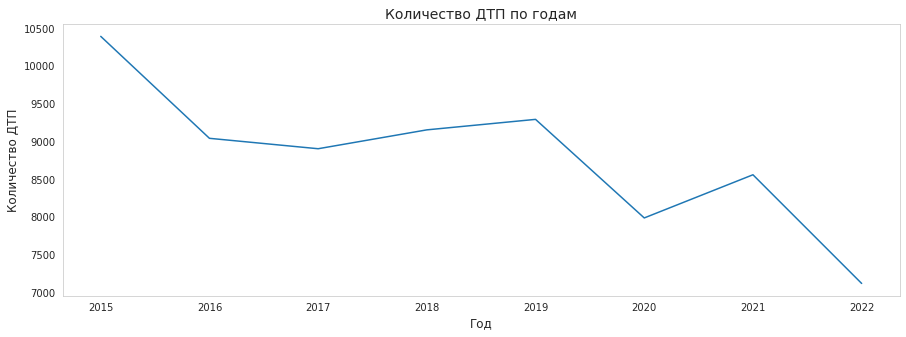

In [27]:
sns.set_style("whitegrid")
plt.figure(figsize=(15, 5))
sns.lineplot(data = accident_per_year, x = 'years', y = 'number_of_accidents')
plt.xlabel('Год', fontsize=12)
plt.ylabel('Количество ДТП', fontsize=12)
plt.title('Количество ДТП по годам', fontsize=14)
plt.grid(None);

**Комментарий**:

Количество ДТП на протяжении 8 лет постепенно сокращается. Есть небольшой рост ДТП в 2018г и 2019г по сравнению с 2017г, а также в 2021г по сравнению с 2020г. Снижение в 2020г обусловлено проведением локдаунов из-за коронавируса, перемещения по Москве были сильно ограничены, население соблюдало режим самоизоляции. Рост числа ДТП в 2021г логичен, т.к. население снова смогло спокойно перемещаться, вырос трафик. В целом динамика положительная, это наглядно видно на графике.

Далее строим часть графиков по одному принципу, поэтому создадим функцию.

In [28]:
def visual(df, col_1, col_2, title, xlabel, ylabel):
  df_new = df.plot(x=col_1, y=col_2, kind='bar', figsize=(15, 8))
  # настроим отображение графика
  plt.title(title, fontsize=14)
  plt.xlabel(xlabel, fontsize=12)
  plt.ylabel(ylabel, fontsize=12)
  plt.xticks(rotation=30)
  plt.grid(None);
  for i in df_new.patches:
    df_new.annotate(
        np.round(i.get_height(), decimals=2),
        (i.get_x()+i.get_width()/2., i.get_height()),
        ha='center',
        va='bottom'
  );

Посмотрим распределение ДТП по **месяцам**. 

In [29]:
accident_per_month = groupby(geodf, 'month', 'id', 'count', 'months', 'number_of_accidents')
accident_per_month

,months,number_of_accidents
0,September,6854
1,October,6710
2,August,6531
3,November,6372
4,June,5980
5,December,5909
6,July,5821
7,May,5821
8,March,5490
9,January,5059


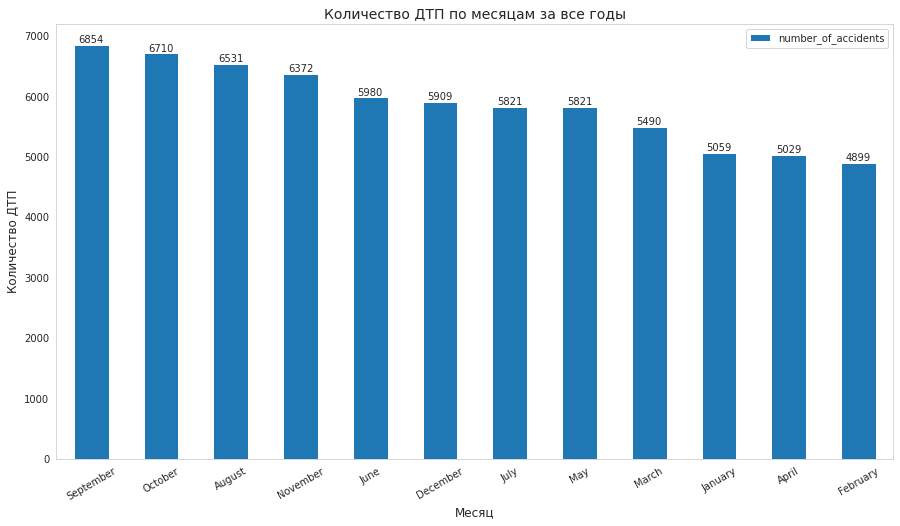

In [30]:
visual(accident_per_month, 'months', 'number_of_accidents', 'Количество ДТП по месяцам за все годы', 'Месяц', 'Количество ДТП')

**Комментарий**: 
В ТОП-3 по количеству ДТП входят сентябрь, октябрь и август, разница между ними минимальна. Вероятно, в этот период увеличивается трафик после сезона отпусков, что приводит к увеличению аварий. Сентябрь занимает первое место. Возможно, это связано с резким увеличением трафика из-за начала учебного года. В целом увеличивается число детей в городе, они не всегда внимательны, поэтому могут создавать аварийные ситуации, переходя через дорогу.
Меньше всего аварий происходит в феврале. Водители привыкают к зимнему стилю вождения, ездят аккуратнее. Часть автовладельцев пересаживается на общественный транспорт. Количество дачников, увеличивающих трафик, значительно меньше, чем в другие месяцы.

Посмотрим распределение ДТП по **сезонам**. 

In [31]:
accident_per_season = groupby(geodf, 'season', 'id', 'count', 'seasons', 'number_of_accidents')
accident_per_season

,seasons,number_of_accidents
0,Осень,19936
1,Лето,18332
2,Весна,16340
3,Зима,15867


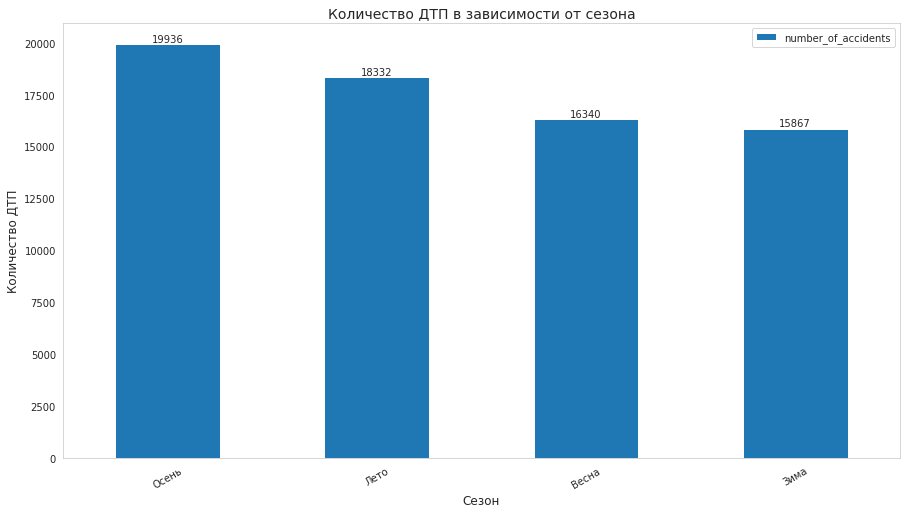

In [32]:
visual(accident_per_season, 'seasons', 'number_of_accidents', 'Количество ДТП в зависимости от сезона', 'Сезон', 'Количество ДТП')

**Комментарий**: 
Больше всего аварий происходит осенью. Вероятно, это связано с началом учебного года и окончанием сезона отпусков, которые создают увеличенный трафик. Погодные и дорожные условия становятся хуже после лета, не все водители вовремя перестраивают стиль и манеру езды.
Как ни странно, меньше всего ДТП происходит зимой. В это время года трафик меньше, т.к. дачный сезон закрыт, часть водителей пересаживается на общественный транспорт, треть января население празднует Новый год и не садится за руль. На дорогах отсутствуют мотоциклы, мотороллеры, электросамокаты, велосипеды, что положительно влияет на дорожную обстановку.

Посмотрим распределение ДТП по **дням недели**. 

In [33]:
accident_per_weekday = groupby(
    geodf, 
    'weekday',
     'id', 'count',
      'weekdays',
      'number_of_accidents'
      )
accident_per_weekday

,weekdays,number_of_accidents
0,Friday,10844
1,Thursday,10456
2,Tuesday,10391
3,Wednesday,10387
4,Monday,10156
5,Saturday,9647
6,Sunday,8594


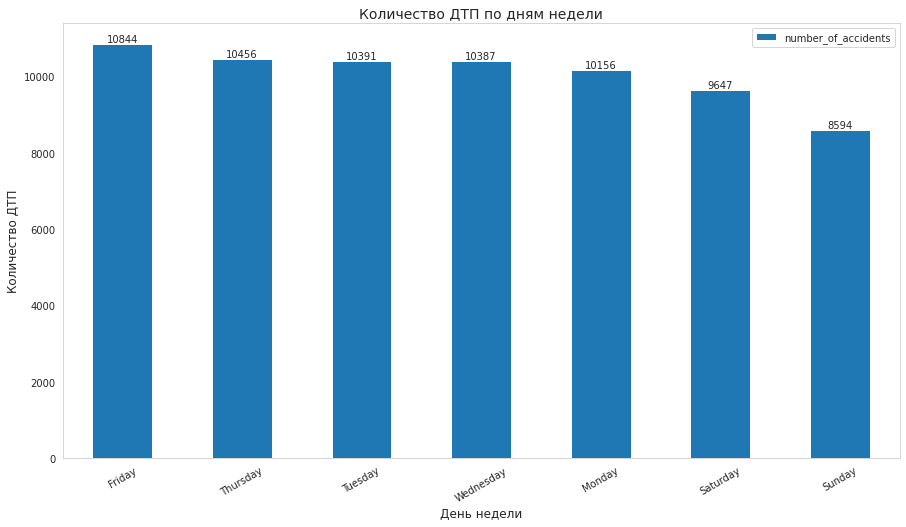

In [34]:
visual(
    accident_per_weekday, 
    'weekdays', 
    'number_of_accidents', 
    'Количество ДТП по дням недели', 
    'День недели', 
    'Количество ДТП'
    )

**Комментарий**:
Итак, больше всего аварий происходит в пятницу, меньше всего в воскресенье.
В пятницу трафик вырастает, а водители менее внимательны после трудовой недели. В воскресенье трафик минимальный, что приводит к значительному сокращению аварий.

Посмотрим распределение ДТП по **времени суток**.



In [35]:
accident_per_time_of_day = groupby(
    geodf, 
    'light', 
    'id', 
    'count', 
    'time_of_day', 
    'number_of_accidents'
    )
accident_per_time_of_day['ratio'] = accident_per_time_of_day['number_of_accidents'] / accident_per_time_of_day['number_of_accidents'].sum() * 100
accident_per_time_of_day

,time_of_day,number_of_accidents,ratio
0,Светлое время суток,41913,59.47
1,"В темное время суток, освещение включено",26902,38.17
2,Сумерки,1059,1.50
3,"В темное время суток, освещение отсутствует",462,0.66
4,"В темное время суток, освещение не включено",138,0.20
5,Не установлено,1,0.00


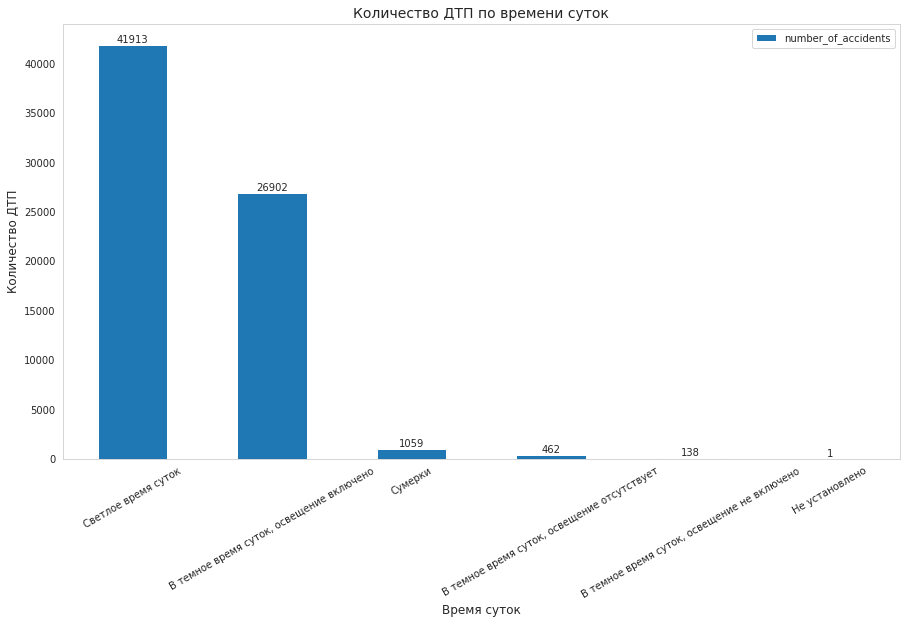

In [36]:
visual(
    accident_per_time_of_day, 
    'time_of_day', 
    'number_of_accidents',
     'Количество ДТП по времени суток',
      'Время суток',
       'Количество ДТП'
       )


In [37]:
accident_per_time_of_day_2 = groupby(
    geodf,
    'time',
    'id',
    'count',
    'time_of_day',
    'number_of_accidents')\
    .sort_values(by='time_of_day')\
    .reset_index(drop=True)

accident_per_time_of_day_2

,time_of_day,number_of_accidents
0,0,2230
1,1,1497
2,2,1064
3,3,803
4,4,760
5,5,879
6,6,1162
7,7,2271
8,8,3527
9,9,3178


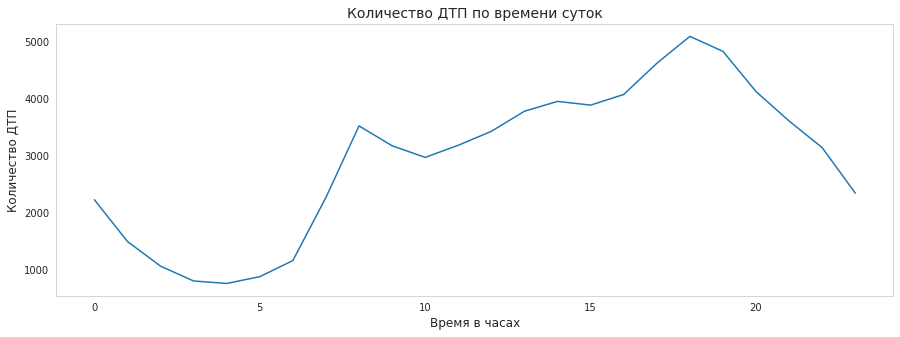

In [38]:
sns.set_style("whitegrid")
plt.figure(figsize=(15, 5))
sns.lineplot(data = accident_per_time_of_day_2, x = 'time_of_day', y = 'number_of_accidents')
plt.xlabel('Время в часах', fontsize=12)
plt.ylabel('Количество ДТП', fontsize=12)
plt.title('Количество ДТП по времени суток', fontsize=14)
plt.grid(None);

**Комментарий**: Больше всего аварий происходит в светлое время суток. Ожидаемо, после минимальной ночной активности происходит рост в 8:00, когда основной поток едет на работу. Но пик аварийности приходится на период с 17 до 19 часов, когда основная масса людей едет после окончания рабочего дня домой. Трафик максимально увеличен, внимание из-за усталости за день снижено.

### Последствия ДТП

Рассмотрим подробнее следующие пункты:

* категория ДТП;
* степень тяжести ДТП.

Данная информация находится в колонках `category` и `severity`. Начнём с **категорий**, присвоим переменной `accident_category`.

In [39]:
accident_category = (
    geodf.value_counts(subset='category')
    .reset_index()
)
accident_category.columns = ['category', 'number_of_accidents']
accident_category['ratio'] = accident_category['number_of_accidents'] / accident_category['number_of_accidents'].sum() * 100
accident_category

,category,number_of_accidents,ratio
0,Столкновение,31637,44.89
1,Наезд на пешехода,24738,35.10
2,Наезд на препятствие,3966,5.63
3,Падение пассажира,3338,4.74
4,Наезд на стоящее ТС,3333,4.73
5,Наезд на велосипедиста,2268,3.22
6,Опрокидывание,826,1.17
7,Съезд с дороги,94,0.13
8,"Наезд на лицо, не являющееся участником дорожн...",65,0.09
9,Иной вид ДТП,61,0.09


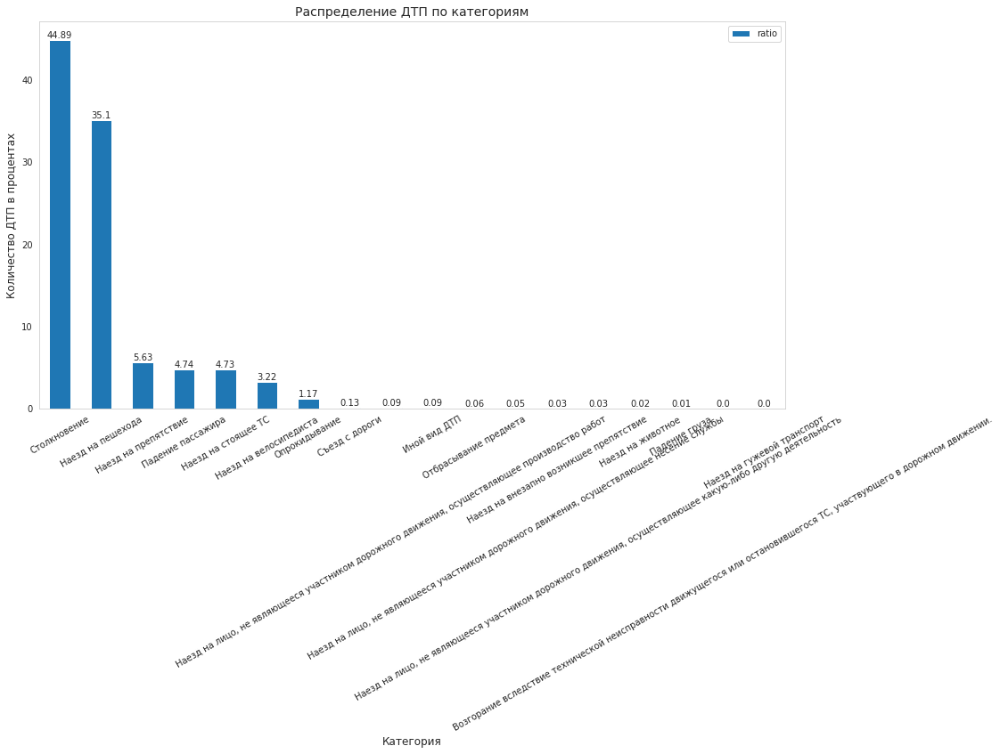

In [40]:
visual(
    accident_category, 
    'category', 
    'ratio', 
    'Распределение ДТП по категориям', 
    'Категория', 
    'Количество ДТП в процентах'
    )

**Комментарий**: 
Безусловно и с огромным отрывом от остальных лидируют две категории:  Столкновение (44,89%) и Наезд на пешехода (35,10%).

Теперь посмотрим аварии в разрезе **степени тяжести** и присвоим переменной `accident_severity`.

In [41]:
accident_severity = (
    geodf.value_counts(subset='severity')
    .reset_index()
)
accident_severity.columns = ['severity', 'number_of_accidents']
accident_severity

,severity,number_of_accidents
0,Легкий,49672
1,Тяжёлый,17427
2,С погибшими,3376


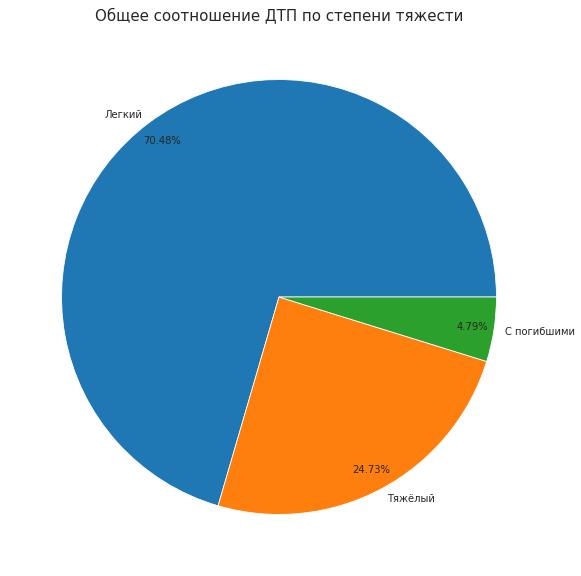

In [42]:
plt.rcParams["figure.figsize"] = (10, 10)
plt.title('Общее соотношение ДТП по степени тяжести', fontsize=15)
values = accident_severity['number_of_accidents']
names = list(accident_severity['severity'])
plt.pie(
    values,
    labels=names,
    labeldistance=1.05,
    autopct='%.2f%%',
    pctdistance=0.9,
    wedgeprops = {'linewidth': 0.8, 'edgecolor': 'white'}
);

Посмотрим распределение по степени тяжести по годам и месяцам, изучим динамику.

In [43]:
accident_dynamics = geodf.groupby(['year', 'severity'])['id'].count().reset_index()
accident_dynamics.columns = ['year', 'severity', 'number_of_accidents']
accident_dynamics.head(6)

,year,severity,number_of_accidents
0,2015,Легкий,6702
1,2015,С погибшими,615
2,2015,Тяжёлый,3079
3,2016,Легкий,5778
4,2016,С погибшими,527
5,2016,Тяжёлый,2740


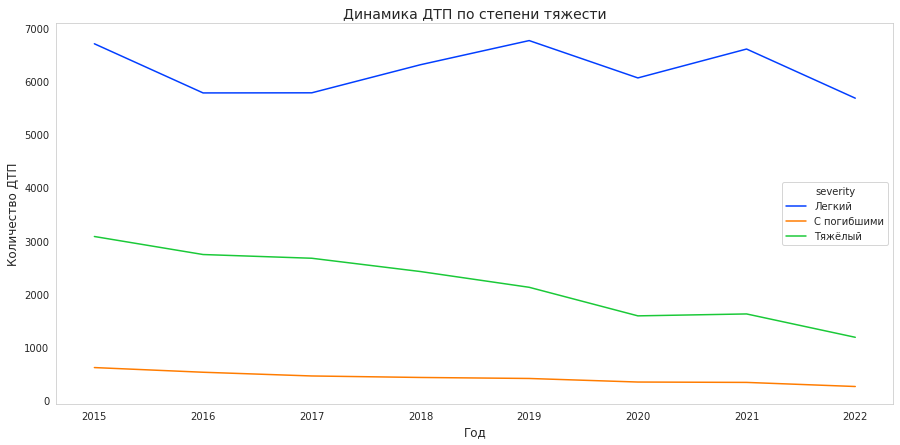

In [44]:
plt.figure(figsize=(15,7))
sns.lineplot(data =accident_dynamics, x = 'year', y = 'number_of_accidents', hue = 'severity', palette='bright')
plt.title('Динамика ДТП по степени тяжести', fontsize=14)
plt.ylabel('Количество ДТП', fontsize=12)
plt.xlabel('Год', fontsize=12)
plt.grid(None);

**Комментарий**: 
При общем распределении за 8 лет подавляющее количество приходится на лёгкие аварии - 70,41%. Тяжёлые аварии составляют значительно меньшую долю - 24,73%, а аварии с погибшими - 4,79%.
Если посмотреть динамику с 2015 по 2022гг, то количество тяжёлых аварий и аварий с погибшими стабильно сокращается. Динамика лёгких аварий не имеет такой стабильности, но тем не менее в 2022г достигла минимума за исследуемый период.

### Анализ в разрезе водителей

Необходимо проанализировать аварии по следующим критериям: 
* пол водителя;
* стаж вождения;
* распределение аварий по степени тяжести в разрезе пола.

Для дальнейшего анализа нам необходимо добавить колонки с полом и стажем водителя, т.к. сейчас эти данные в формате `json`.
Для этого воспользуемся функцией.

In [45]:
def get_gender(cell): # добавим пол водителя
    if len(cell) > 0:
        return (cell[0]['participants'][0]['gender'])
    else: return np.nan

geodf['driver_gender'] = geodf['vehicles'].apply(get_gender)  

In [46]:
def get_experience(cell):
    if len(cell) > 0:
        return (cell[0]['participants'][0]['years_of_driving_experience'])
    else: return np.nan
geodf['driver_experience'] = geodf['vehicles'].apply(get_experience)   

In [47]:
# geodf.sample(1) # удостоверились в добавлении колонок

Посмотрим распределение по **полу водителя**.


In [48]:
gender = (
    geodf.value_counts(subset='driver_gender')
    .reset_index()
)
gender.columns = ['driver_gender', 'number_of_accidents']
gender

,driver_gender,number_of_accidents
0,Мужской,54045
1,Женский,14920


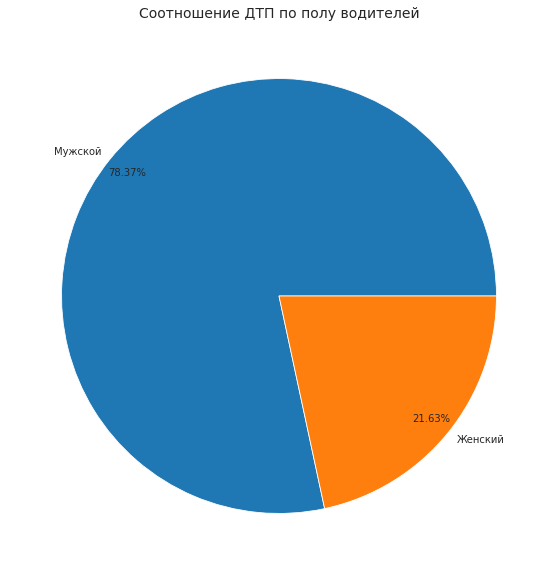

In [49]:
plt.rcParams["figure.figsize"] = (10, 10)
plt.title('Соотношение ДТП по полу водителей', fontsize=14)
values = gender['number_of_accidents']
names = list(gender['driver_gender'])
plt.pie(
    values,
    labels=names,
    labeldistance=1.05,
    autopct='%.2f%%',
    pctdistance=0.9,
    wedgeprops = {'linewidth': 0.8, 'edgecolor': 'white'}
);

**Комментарий**:

Водители мужчины (78,37%) участвуют в значительно большем количестве ДТП, чем женщины (21,63%). Вероятно, количество мужчин за рулём сильно превышает количество женщин вообще, поэтому мы видим такой результат.

Посмотрим распределение по **стажу вождения водителя**.


In [50]:
experience = (
    geodf.value_counts(subset='driver_experience')
    .reset_index()
)
experience.columns = ['driver_experience', 'number_of_accidents']
experience.head(10)

,driver_experience,number_of_accidents
0,5.00,2972
1,1.00,2829
2,3.00,2672
3,2.00,2658
4,7.00,2575
5,8.00,2574
6,9.00,2516
7,4.00,2501
8,6.00,2414
9,10.00,2412


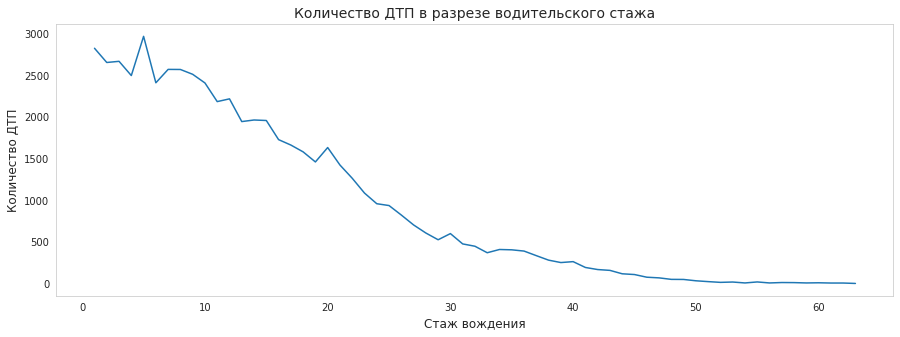

In [51]:
sns.set_style("whitegrid")
plt.figure(figsize=(15, 5))
sns.lineplot(data = experience, x = 'driver_experience', y = 'number_of_accidents')
plt.xlabel('Стаж вождения', fontsize=12)
plt.ylabel('Количество ДТП', fontsize=12)
plt.title('Количество ДТП в разрезе водительского стажа', fontsize=14)
plt.grid(None);

**Комментарий**:

Очевидно, что в первые несколько лет из-за отсутствия опыта у водителя происходит больше всего ДТП. Постепенно их количество сокращается. Наши исследования подтверждают, что основными виновниками ДТП в исследуемом периоде были водители со стажем до 10 лет. При этом обнаружен любопытный инсайт, больше всего ДТП происходит у водителей с 5-летним стажем - 2972 шт. 

Теперь изучим распределение аварий за всё время по **степени тяжести в разрезе пола**.

In [52]:
accident_severity_by_gender = geodf.groupby(['driver_gender', 'severity'])['id'].count().reset_index()
accident_severity_by_gender.columns = ['driver_gender', 'severity', 'number_of_accidents']
accident_severity_by_gender['ratio'] = (
    accident_severity_by_gender['number_of_accidents'] / 
    accident_severity_by_gender['number_of_accidents']
    .sum() * 100
    )
accident_severity_by_gender

,driver_gender,severity,number_of_accidents,ratio
0,Женский,Легкий,11146,16.16
1,Женский,С погибшими,367,0.53
2,Женский,Тяжёлый,3407,4.94
3,Мужской,Легкий,37403,54.23
4,Мужской,С погибшими,2956,4.29
5,Мужской,Тяжёлый,13686,19.84


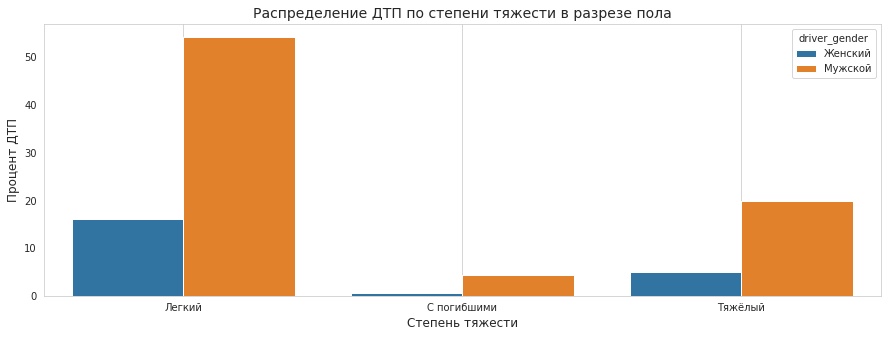

In [53]:
plt.figure(figsize=(15, 5))
sns.barplot(data=accident_severity_by_gender, x='severity', y='ratio', hue='driver_gender')
plt.title('Распределение ДТП по степени тяжести в разрезе пола', fontsize=14)
plt.xlabel('Степень тяжести', fontsize=12)
plt.ylabel('Процент ДТП', fontsize=12)
plt.xticks(rotation=0)
plt.grid(None);

**Комментарий**:
И мужчины, и женщины чаще всего попадают в лёгкие аварии, 54,23% и 16,16% от общего количества ДТП соответственно. Меньше всего попадают в аварии с погибшими - 4,29% и 0,53% от общего числа.

### Анализ ситуации в городе

Необходимо выяснить следующее:
* Пять районов города с наибольшим числом ДТП.
* Изучить динамику этих пяти районов, где количество аварий сокращается, а где увеличивается.
* Районы с самым большим и самым маленьким количеством случаев со смертельным исходом.
* Районы, в которых участники ДТП чаще получают травмы.

Итак, вычислим **пять самых аварийно-опасных** районов Москвы.

In [54]:
accident_region = (
    geodf.groupby('region')
    .agg({'id': 'count', 'year': 'nunique'})
    .sort_values(by='id', ascending=False)
    .rename(columns={'id': 'number_of_accidents'})
    .reset_index()
)
accident_region['accident_per_year_mean'] = accident_region['number_of_accidents']/accident_region['year']
accident_region_five = accident_region.head(5)
accident_region_five

,region,number_of_accidents,year,accident_per_year_mean
0,Выхино-Жулебино,1076,8,134.50
1,Люблино,1058,8,132.25
2,Спецтрассы,1018,8,127.25
3,Южное Бутово,1014,8,126.75
4,Пресненский,996,8,124.50


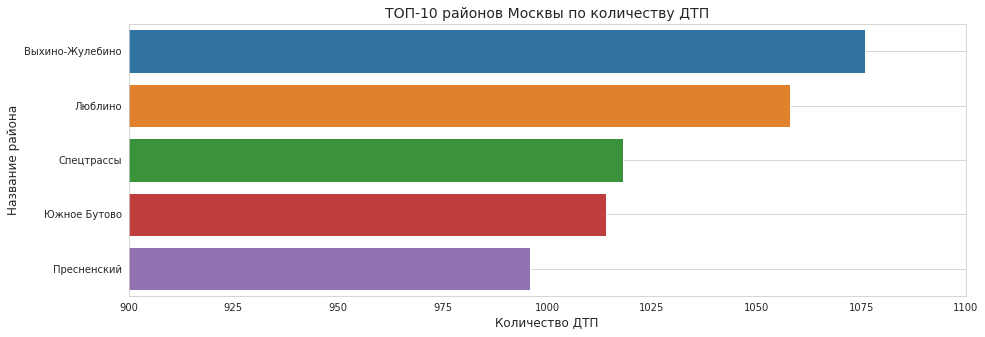

In [55]:
plt.figure(figsize=(15, 5))
sns.barplot(data=accident_region_five, x='number_of_accidents', y='region', color=None)
plt.title('ТОП-10 районов Москвы по количеству ДТП', fontsize=14)
plt.xlabel('Количество ДТП', fontsize=12)
plt.ylabel('Название района', fontsize=12)
plt.xticks(rotation=0)
plt.xlim(900, 1100)
plt.grid(None);

**Комментарий**: 

Тройка лидеров по ДТП в порядке убывания: Выхино-Жулебино, Люблино и Спецтрассы. Стоит отметить, что по среднему количеству аварий в год эти три района также лидируют. Все эти районы находятся на окраинах, где сосредоточено большое количество людей и есть скоростные магистрали, шоссе. Вероятно, совокупность этих факторов и привела к лидерству по количеству ДТП.

Изучим **динамику** за 8 лет.

In [56]:
top_5 = list(accident_region_five['region'])
accident_region_dynamics = (
    geodf
    .query('region == @top_5')
    .pivot_table(index='region', columns='year', values='id', aggfunc='count')    
)
accident_region_dynamics

year,2015,2016,2017,2018,2019,2020,2021,2022
region,,,,,,,,
Выхино-Жулебино,123,107,117,138,172,139,153,127
Люблино,146,112,114,150,174,143,128,91
Пресненский,117,101,122,110,132,143,153,118
Спецтрассы,145,132,111,116,140,127,116,131
Южное Бутово,181,128,131,108,131,109,124,102


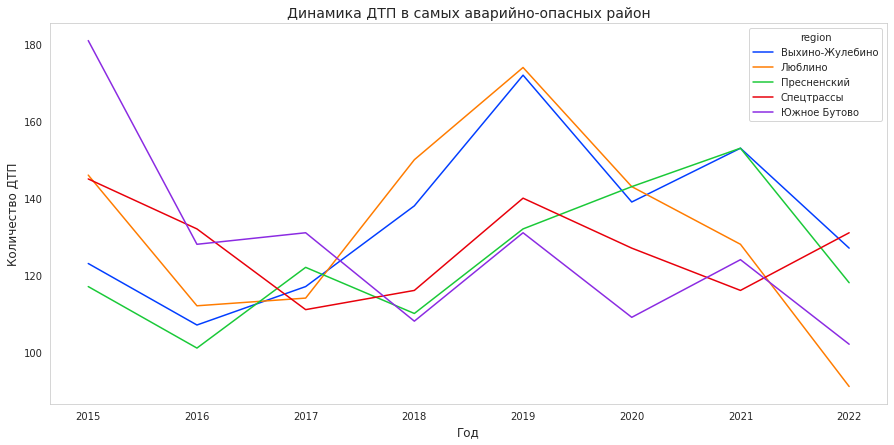

In [57]:
plt.figure(figsize=(15,7))
sns.lineplot(
    data=geodf
    .query('region == @top_5')
    .groupby(['year', 'region'])['id']
    .count()
    .reset_index(), x = 'year', y = 'id', hue = 'region', palette='bright')
plt.title('Динамика ДТП в самых аварийно-опасных район', fontsize=14)
plt.ylabel('Количество ДТП', fontsize=12)
plt.xlabel('Год', fontsize=12)
plt.grid(None);

**Комментарий**: 

При более детальном рассмотрении динамики по годам ситуация несколько меняется. Подробнее по районам:
 * **Выхино-Жулебино**. С 2015 по 2019 количество ДТП увеличивалось. Затем ситуация начала улучшаться и к 2022г вернулась на показатель 2015г.
 * **Люблино**. В 2015г в этом районе было больше всего аварий. Затем два года подряд была положительная динамика. В 2019 резкий рост числа аварий, район снова стал "рекордсменом". После этого началось стабильное снижение и показатель 2022г сейчас самый низкий за всё время.
 * **Пресненский**. На 2015г в районе был самый низкий показатель ДТП (из пятёрки худших районов). В 2019-2021гг количество ДТП росло, район стал самым аварийно-опасным в 2021г. В 2022г тенденция изменилась и мы видим положительную динамику.
 * **Спецтрассы**. Динамику района нельзя назвать положительной. Вопреки общему тренду на снижение числа ДТП в Москве здесь довольно стабильный показатель. Более того последние два года количество ДТП увеличивается.
 * **Южное Бутово**. Количество ДТП значительно снизилось и имеет однозначно положительную динамику, т.к. В 2015г здесь было больше всего аварий, своеобразный рекорд. 

Районы с самым большим и самым маленьким количеством **случаев со смертельным исходом**.

In [58]:
# выведем все районы по количеству смертельных случаев
dead_region = (
    geodf.groupby('region')
    .agg({'dead_count': 'sum'})
    .sort_values(by='dead_count', ascending=False)
    .rename(columns={'dead_count': 'number_of_deaths_cases'})
    .reset_index()
)
dead_region['ratio'] = dead_region['number_of_deaths_cases'] / dead_region['number_of_deaths_cases'].sum() * 100


In [59]:
dead_region.head(5) #районы с самым большим количеством случаев со смертельным исходом

,region,number_of_deaths_cases,ratio
0,Спецтрассы,85,2.33
1,Сосенское,63,1.72
2,Выхино-Жулебино,62,1.70
3,Дорогомилово,62,1.70
4,Люблино,60,1.64


In [60]:
dead_region.tail(5) #районы с самым маленьким количеством случаев со смертельным исходом

,region,number_of_deaths_cases,ratio
142,Ростокино,4,0.11
143,Восточное Дегунино,3,0.08
144,Старое Крюково,3,0.08
145,Поселок Восточный,2,0.05
146,Кокошкино,2,0.05


In [61]:
print('Количество ДТП со смертельным исходом в худшем районе, превышает лучший показатель в', round(dead_region['number_of_deaths_cases'].max()/dead_region['number_of_deaths_cases'].min(),2), 'раз')

Количество ДТП со смертельным исходом в худшем районе, превышает лучший показатель в 42.5 раз


**Комментарий**:
Районы с самым большим количеством случаев со смертельным исходом уже знакомы нам по предыдущему пункту исследования, в них в тотале самое большое количество ДТП. Такой вывод вполне очевиден, чем больше трафик, тем больше количество ДТП, тем больше аварий с погибшими.
Этот вывод подходит и для районов с минимальным количеством смертельных исходов: меньше население => меньше трафик => меньше ДТП => меньше смертей на дороге.

Районы, в которых участники ДТП **чаще получают травмы**. 

In [62]:
injury = (
    geodf.groupby('region')
    .agg({'injured_count': 'sum'})
    .sort_values(by='injured_count', ascending=False)
    .rename(columns={'injured_count': 'number_of_injury_cases'})
    .reset_index()
)
injury['ratio'] = injury['number_of_injury_cases'] / injury['number_of_injury_cases'].sum() * 100
injury.head()

,region,number_of_injury_cases,ratio
0,Выхино-Жулебино,1276,1.59
1,Спецтрассы,1241,1.54
2,Люблино,1237,1.54
3,Южное Бутово,1225,1.52
4,Гольяново,1105,1.37


**Комментарий**:
Всё логично, чем больше трафик, тем больше ДТП и полученных травм. В данный список попали все уже известные нам районы, кроме Гольяново.

## Визуализация на карте 

* Визуализировать на карте ДТП в городе с помощью `heatmap` за все время.
* Визуализировать на карте все случаи со смертельным исходом:
  * поточечно;
  * кластерами.



Выведем карту Москвы.

In [63]:
moscow_map= folium.Map(location=[55.751999, 37.617734], zoom_start=8)
moscow_map

В колонке `point` есть координаты, необходимо разделить долготу и широту в разные столбцы.

In [64]:
# добавим столбцы с долготой и шириной
geodf['long'] = geodf.point.apply(lambda x: x['long'])
geodf['lat'] = geodf.point.apply(lambda x: x['lat'])

In [65]:
geodf.sample(1) # убедились в добавлении колонок

,geometry,id,tags,light,point,nearby,region,scheme,address,weather,category,datetime,severity,vehicles,dead_count,participants,injured_count,parent_region,road_conditions,participants_count,participant_categories,year,month,weekday,time,season,driver_gender,driver_experience,long,lat
29950,POINT (37.61555 55.80475),2523363,[Дорожно-транспортные происшествия],Светлое время суток,"{'lat': 55.804748, 'long': 37.615546}","[Многоквартирные жилые дома, Административные ...",Марьина роща,040,"г Москва, ул Шереметьевская, 29",[Пасмурно],Столкновение,2020-12-03 10:24:00,Легкий,"[{'year': 2019, 'brand': 'TOYOTA', 'color': 'С...",0,[],1,Москва,[Мокрое],2,[Все участники],2020,December,Thursday,10,Зима,Мужской,14.00,37.62,55.80


Отобразим **тепловую карту** по количеству ДТП за всё время. 

In [66]:
# подготовим датафрейм, очистив от пропусков в колонках 'lat' и 'long'
geodf_filtered = geodf.dropna(subset=['lat', 'long'])

m_heatmap = folium.Map([55.751244, 37.618423], zoom_start=8)
heatmap = geodf_filtered[['lat','long']]
m_heatmap.add_child(plugins.HeatMap(heatmap, radius=14))

# выведем карту
m_heatmap

Визуализируем на карте все случаи со **смертельным исходом** поточечно.

In [67]:
for lat, lng, label in zip(geodf_filtered.lat, geodf_filtered.long, geodf_filtered.dead_count.astype(str)):
    if label!='0':
        folium.features.CircleMarker(
            [lat, lng],
            radius=3,
            color='red',
            fill=True,
            popup=label,
            fill_color='darkred',
            fill_opacity=0.6
        ).add_to(moscow_map)

moscow_map

Теперь объединим все случаи со смертельным исходом в кластеры.

In [68]:
moscow_map_clust= folium.Map(location=[55.751999, 37.617734], zoom_start=8)

# Instantiate a mark cluster object for the car accidents
accidents = plugins.MarkerCluster().add_to(moscow_map_clust)

# Display only accidents where serious injuries where recorded
for lat, lng, label in zip(geodf_filtered.lat, geodf_filtered.long, geodf_filtered.dead_count.astype(str)):
    if label!='0':
        folium.Marker(
            location=[lat, lng],
            icon=None,
            popup=label,
        ).add_to(accidents)

moscow_map_clust

## ВЫВОДЫ

На основе имеющихся данных по количеству ДТП в Москве за период январь 2015 - ноябрь 2022 было проведено исследование транспортной безопасности и основных причин аварий. Итак, по порядку. 

### Вешние условия в момент ДТП

Количество ДТП на **протяжении 8 лет** постепенно сокращается, с 10396 шт. в 2015г до 7122 шт. в 2022г. Есть небольшой рост ДТП в 2018г и 2019г, а также в 2021г. Снижение в 2020г обусловлено проведением локдаунов из-за коронавируса, перемещения по Москве были сильно ограничены, население соблюдало режим самоизоляции. Рост числа ДТП в 2021г логичен, т.к. население снова смогло спокойно перемещаться, что привело к росту трафика и аварий. 

В разрезе **месяцев** сентябрь (6854), октябрь (6710) и август (6531) лидируют по количеству аварий. В этот период увеличивается трафик после сезона отпусков, на дорогах много других видов транспорта: велосипедов, самокатов, мотоциклов. Сентябрь занимает первое место, т.к. в этот месяц трафик особенно сильно растёт из-за начала учебного года. Меньше всего аварий происходит в феврале (4899). Вероятные причины: водители привыкают к зимнему стилю вождения, ездят аккуратнее, количество дней в феврале меньше среднего, часть автовладельцев пересаживается на общественный транспорт, на дорогах практически отсутствуют велосипеды, самокаты (кроме курьерской доставки), мотоциклы и мотороллеры. 

В разрезе **сезонов** больше всего аварий происходит осенью (19936), что полностью коррелируется с данными в разрезе месяцев (выше). Более того погодные и дорожные условия становятся хуже после лета, не все водители вовремя перестраивают стиль и манеру езды. Меньше всего ДТП происходит зимой (15867). В это время года трафик меньше, т.к. дачный сезон закрыт, часть водителей пересаживается на общественный транспорт, треть января население празднует Новый год и не садится за руль. На дорогах физически меньше транспортных средств.  

В разрезе **дней недели** больше всего аварий происходит по пятницам (10844), меньше всего по воскресеньям (8594). В пятницу трафик вырастает, а водители менее внимательны после трудовой недели. В воскресенье трафик минимальный, что приводит к значительному сокращению аварий.

В разрезе **времени суток** больше всего аварий происходит в светлое время (41913 или 59,47 %) и в темное время, когда освещение включено (26902 или 38,17%). Ожидаемо, после минимальной ночной активности происходит резкий рост трафика в 8:00, когда едет основной поток на работу. Тем не менее пик аварийности приходится на период с 17 до 19 часов, когда основная масса людей едет после окончания рабочего дня домой. Трафик максимально увеличен, внимание из-за усталости за день снижено.

### Последствия ДТП

В датасете все ДТП разделены на **18 категорий**, при этом 80% аварий приходится на две из них: Столкновение (44,89%) и Наезд на пешехода (35,10%).
 
По **степени тяжести** подавляющее количество приходится на лёгкие аварии - 70,41%. Тяжёлые аварии составляют 24,73%, а аварии с погибшими 4,79%. В динамике за 8 лет количество тяжёлых аварий и аварий с погибшими стабильно сокращается. Динамика лёгких аварий не имеет такой стабильности, но тем не менее в 2022г достигла минимума за исследуемый период.



### Водители

Водители мужчины (78,37%) участвуют в значительно большем количестве ДТП, чем женщины (21,63%). Главная причина: количество мужчин за рулём сильно превышает количество женщин.

И мужчины, и женщины чаще всего попадают в лёгкие аварии, 54,23% и 16,16% от общего количества ДТП соответственно. Меньше всего попадают в аварии с погибшими - 4,29% и 0,53% от общего числа.

Основными виновниками ДТП в исследуемом периоде оказались водители со стажем до 10 лет. При этом обнаружен любопытный инсайт, больше всего ДТП происходит у водителей с 5-летним стажем. Вероятно, к этому времени водитель начинает чувствовать себя уверенно за рулём, становится менее внимательным, что и приводит к такому результату.

### Ситуация в городе

Пять **самых аварийно-опасных района** Москвы за 8 лет в порядке убывания: Выхино-Жулебино (1076 аварий), Люблино (1058), Спецтрассы (1018) Южное Бутово (1014) и Пресненский (996). Они также лидируют по среднему количеству аварий в год, находятся на окраинах, где сосредоточено большое количество людей и есть скоростные магистрали, шоссе. Большой трафик увеличивает количество аварий.

В четырёх из пяти районов из списка выше в 2022г наметилась положительная динамика по сокращению количества ДТП. Исключение: Пресненский район, в котором много ошибок при проектировании пешеходных переходов, поэтому люди перебегают дорогу в неположенном месте, становясь жертвами ДТП.

Тем не менее Пресненский район не попал в список районов с самым большим количеством **случаев со смертельным исходом**. В него вошли следующие районы в порядке убывания смертельных случаев (количество указано в скобках): Спецтрассы (85), Сосенское (63), Выхино-Жулебино (62), Дорогомилово (62), Люблино (60). Самые безопасные районы по этому критерию в порядке уменьшения смертельных случаев следующие (количество указано в скобках): Ростокино (4), Восточное Дегунино (3), Старое Крюково (3), Поселок Восточный (2) и Кокошкино (2).

Больше всего **травм** получено в следующих районах: Выхино-Жулебино (1276), Спецтрассы (1241), Люблино (1237), Южное Бутово (1225) и Гольяново (1105). 